In [273]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import ast
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pyvis.network import Network
import os
import ast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from pyvis.network import Network
import re

In [274]:
df1 = pd.read_csv('../temp/31i3y3aur3k2mejzzfyuxvulxuoy/top_tracks.csv')
df2 = pd.read_csv('../temp/31i3y3aur3k2mejzzfyuxvulxuoy/recent_tracks.csv')
df3 = pd.read_csv('../temp/31i3y3aur3k2mejzzfyuxvulxuoy/user_songs.csv')
df = pd.concat([df1,df2,df3])
df.drop(columns=['similar_songs', 'name_url', 'artist_url', 'album_url', 'album_art', 'popularity'], inplace=True)
df.dropna(inplace=True)
df['genres'] = df['genres'].apply(ast.literal_eval)
df['genres'] = df['genres'].apply(lambda lst: ['hip hop' if g.lower() in ['hip-hop', 'hip hop'] else g for g in lst])
df['genres'] = df['genres'].apply(lambda lst: sorted(set(lst)))
df = df[df['genres'].apply(lambda x: len(x) > 0)]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3330 entries, 0 to 3597
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   playlist   3330 non-null   object 
 1   name       3330 non-null   object 
 2   artist     3330 non-null   object 
 3   album      3330 non-null   object 
 4   year       3330 non-null   int64  
 5   genres     3330 non-null   object 
 6   playcount  3330 non-null   float64
dtypes: float64(1), int64(1), object(5)
memory usage: 208.1+ KB


In [349]:
df.playcount.sort_values()

324         229.0
985         404.0
1153        538.0
264         605.0
332         689.0
          ...    
1607    8733161.0
1663    8733161.0
1662    8733161.0
1529    8733161.0
1569    8733161.0
Name: playcount, Length: 3330, dtype: float64

In [301]:
import os
import ast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from pyvis.network import Network
import re



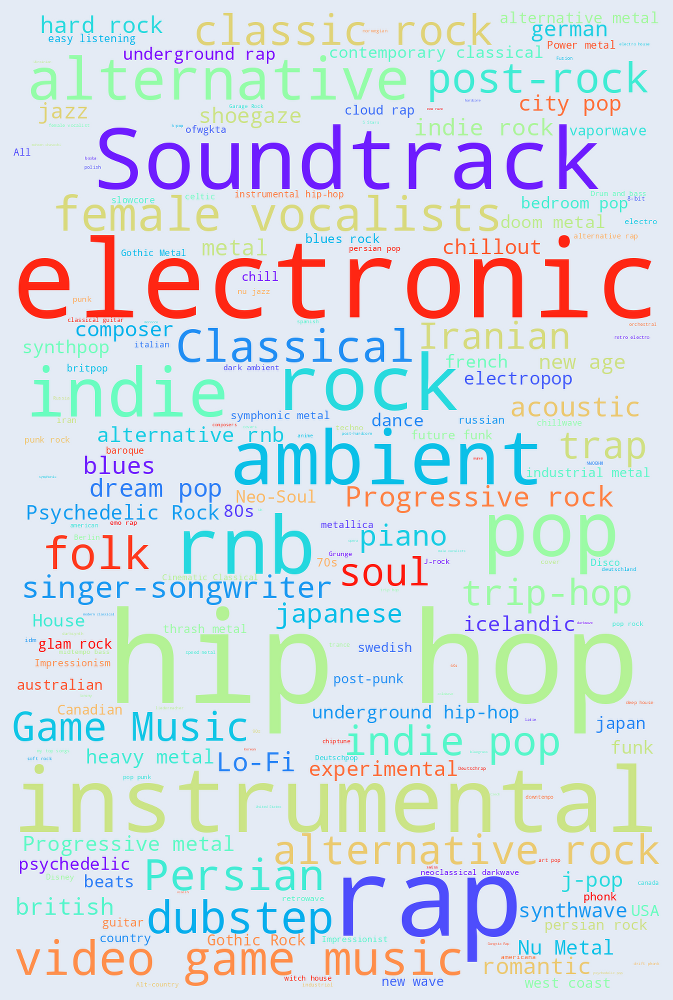

In [390]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordcloud_genres_vertical(df):
    genre_counts = df.explode('genres')['genres'].value_counts()
    
    wc = WordCloud(
        width=1000,
        height=1500,
        background_color='#E4EBF5',
        colormap='rainbow',
        max_words=200,
        prefer_horizontal=1,  # 0 → fully vertical words
    ).generate_from_frequencies(genre_counts)
    
    plt.figure(figsize=(6,9), facecolor='#E4EBF5', dpi=500)
    plt.imshow(wc, interpolation='lanczos')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
plot_wordcloud_genres_vertical(df)

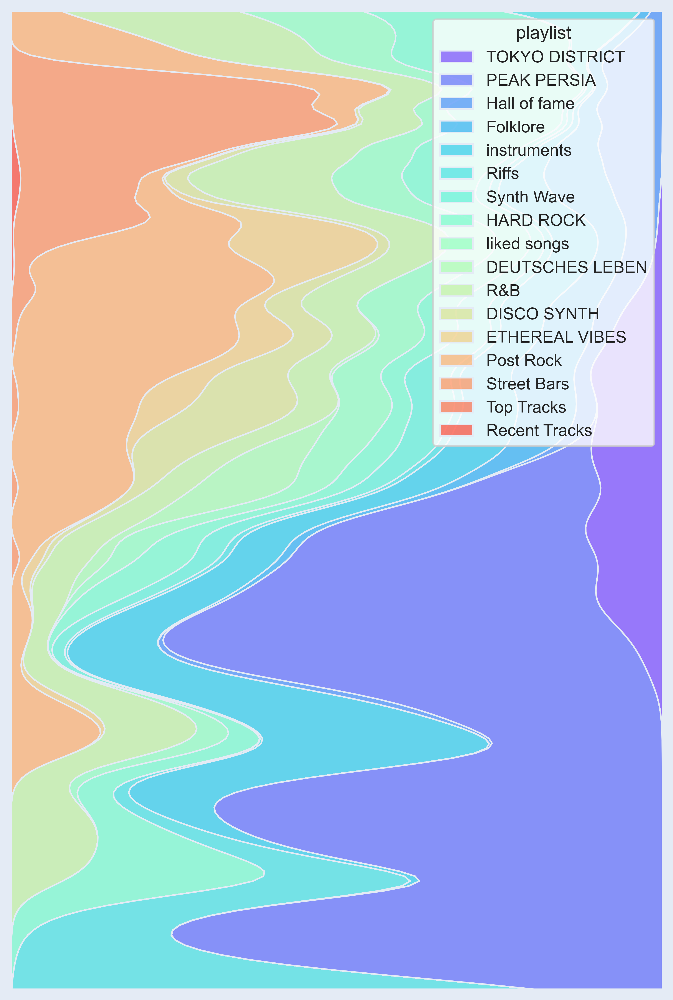

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_playcount_distribution_vertical_clean(df):
    df_exploded = df.explode('genres')
    
    fig, ax = plt.subplots(figsize=(6,9), dpi=500, facecolor='#E4EBF5')

    log_playcounts = np.log1p(df_exploded["playcount"])
    
    sns.kdeplot(
        data=df_exploded,
        y=log_playcounts,
        hue='playlist',
        multiple='fill',
        fill=True,
        alpha=0.6,
        linewidth=1,
        edgecolor='#E4EBF5',
        warn_singular=False,
        palette='rainbow',
        ax=ax
    )
    sns.move_legend(ax, 'upper right')
    ax.set_axis_off()
    ax.set_facecolor('#E4EBF5')

    # Remove any extra padding/margins
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    plt.show()
    # To save without padding:
    # fig.savefig("clean_plot.png", dpi=500, bbox_inches='tight', facecolor='#E4EBF5')

# Usage
plot_playcount_distribution_vertical_clean(df)

In [416]:
def get_artist_genre_playlist_network_html(df):
    df_exploded = df.explode('genres')
    top_artists = df['artist'].value_counts().head(30).index
    top_genres = df_exploded['genres'].value_counts().head(20).index
    top_playlists = df['playlist'].value_counts().head(5).index

    df_filtered = df[df['artist'].isin(top_artists)]
    df_filtered = df_filtered[df_filtered['playlist'].isin(top_playlists)]
    df_filtered = df_filtered[df_filtered['genres'].apply(lambda gs: any(g in top_genres for g in gs))]
    df_exploded_edges = df_filtered.explode('genres')

    net = Network(height="100vh", width="50%", bgcolor="#E4EBF5", notebook=True,
                  cdn_resources='in_line', filter_menu=True, select_menu=True)
    net.force_atlas_2based()
    net.set_edge_smooth(smooth_type='discrete')
    net.set_edge_smooth(smooth_type='straightCross')

    for artist in top_artists:
        
        net.add_node(artist, label=artist, color="#4bd183", mass=1,
                     font={"color": "#636363", "size": 18, "face": "helvetica"}, title=f"Artist: {artist}")

    for genre in top_genres:
        net.add_node(genre, label=genre, shape='circle', mass=2,
                     color="#6d5dfc", font={"color": "#E4EBF5", "size": 18, "face": "helvetica"}, title=f"Genre: {genre}")

    for pl in top_playlists:
        net.add_node(pl, label=pl, shape='circle', mass=3,
                     color="#ff4400", font={"color": "#ffffff", "size": 18, "face": "helvetica"}, title=f"Playlist: {pl}")

    for _, row in df_exploded_edges.iterrows():
        if row['genres'] in top_genres:
            net.add_edge(row['artist'], row['genres'], color="#4D4D4D50", title="Artist ↔ Genre")
        if row['genres'] in top_genres and row['playlist'] in top_playlists:
            net.add_edge(row['genres'], row['playlist'], color="#88888850", title="Genre ↔ Playlist")

    # Generate HTML as string
    # network_html = net.generate_html(notebook=False)
    net.show('here.html')

    # return network_html
get_artist_genre_playlist_network_html(df)
    

here.html


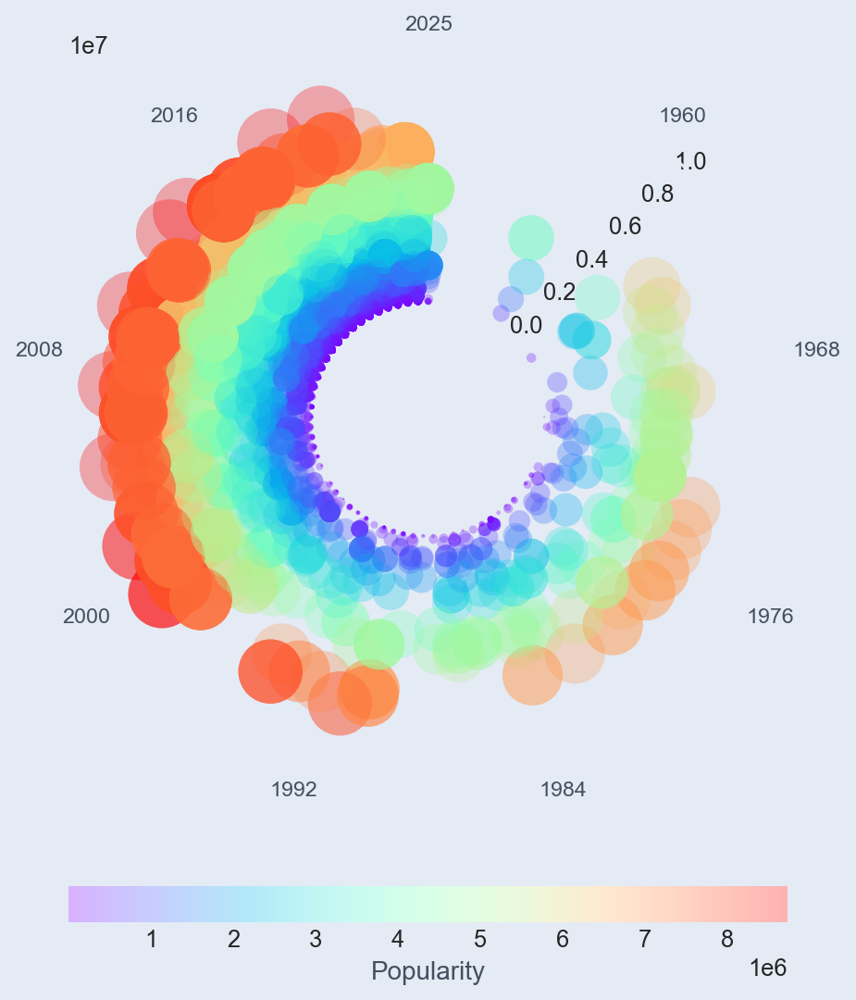

In [472]:
def plot_polar_playcount_playlist(df, plots_dir=None):
    min_year, max_year = df['year'].min(), df['year'].max()
    angles = 2 * np.pi * (df['year'] - min_year) / (max_year - min_year)

    radii = df['playcount']
    sizes = df['playcount'] / df['playcount'].max() * 1000

    # Use max 10 playlists for color mapping
    top_playlists = df['playlist'].value_counts().head(10).index
    df_plot = df[df['playlist'].isin(top_playlists)]
    playlist_to_color = {pl: i for i, pl in enumerate(top_playlists)}
    colors = df_plot['playlist'].map(playlist_to_color)

    fig = plt.figure(figsize=(6,9), dpi=167, facecolor='#E4EBF5')
    ax = fig.add_subplot(projection='polar', facecolor='#E4EBF5')
    scatter = ax.scatter(
        angles, 
        radii, 
        c=df['playcount'],
        s=sizes, 
        cmap='rainbow', 
        alpha=0.3,
        edgecolor='white',
        linewidth=0.0,
    )

    ax.set_ylim(-1_000_000, 10_500_000)
    ax.set_rorigin(-5_000_000)
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(45)
    ax.grid(False)
    for spine in ax.spines.values():  # polar spines
        spine.set_color('#E4EBF5')   # or set linewidth=0 to hide

    
    num_ticks = min(10, max_year - min_year + 1)
    theta_ticks = np.linspace(0, 2*np.pi, num_ticks, endpoint=True)[1:]
    year_labels = [str(int(y)) for y in np.linspace(min_year, max_year, num_ticks, endpoint=True)][1:]
    ax.set_xticks(theta_ticks)
    ax.set_xticklabels(year_labels, color="#474e5f", fontsize=10)
    cbar = fig.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.1)
    cbar.outline.set_visible(False)
    cbar.ax.tick_params(length=0)
    cbar.set_label("Popularity", color="#474e5f")
    plt.show()
    # plt.savefig(os.path.join(plots_dir, "polar_playcount_playlist.png"))
    # plt.close()
plot_polar_playcount_playlist(df)

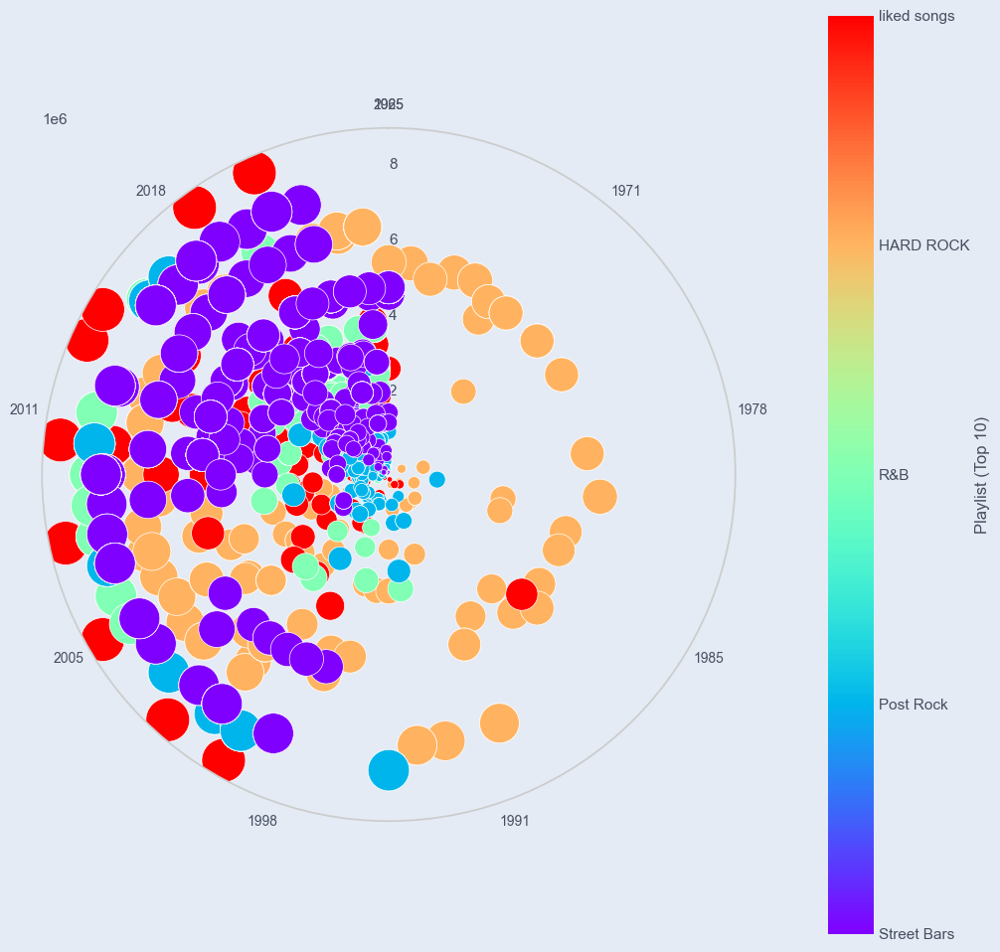

In [449]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_polar_playcount_playlist(df, plots_dir=None):
    # Use only top 10 playlists for clarity
    top_playlists = df['playlist'].value_counts().head(5).index
    df_plot = df[df['playlist'].isin(top_playlists)].copy()
    
    # Normalize year to angle [0, 2pi]
    min_year, max_year = df_plot['year'].min(), df_plot['year'].max()
    df_plot['angle'] = 2 * np.pi * (df_plot['year'] - min_year) / (max_year - min_year)
    
    # Radii: playcounts
    radii = df_plot['playcount']
    
    # Sizes: scale playcounts to marker size
    sizes = df_plot['playcount'] / df_plot['playcount'].max() * 1000
    
    # Map playlist to colors
    playlist_to_color = {pl: i for i, pl in enumerate(top_playlists)}
    colors = df_plot['playlist'].map(playlist_to_color)
    
    # Plot
    fig = plt.figure(figsize=(12,12), facecolor='#E4EBF5')
    ax = fig.add_subplot(projection='polar', facecolor='#E4EBF5')  # axis background same as figure
    
    scatter = ax.scatter(
        df_plot['angle'],
        radii,
        c=colors,
        s=sizes,
        cmap='rainbow',
        alpha=1,
        edgecolor='white',
        linewidth=0.5
    )
    
    # Polar axes tweaks
    ax.set_theta_zero_location('N')  # start at top
    ax.set_theta_direction(-1)       # clockwise
    ax.set_rlabel_position(0)        # radial labels at top
    ax.grid(True, color='#E4EBF5')   # grid color same as background
    
    # Set theta ticks to actual years
    num_ticks = min(10, max_year - min_year + 1)  # max 10 ticks for readability
    theta_ticks = np.linspace(0, 2*np.pi, num_ticks)
    year_labels = [str(int(y)) for y in np.linspace(min_year, max_year, num_ticks)]
    ax.set_xticks(theta_ticks)
    ax.set_xticklabels(year_labels, color="#474e5f", fontsize=10)
    
    # Set radial label color
    ax.tick_params(axis='y', colors="#474e5f")
    
    # Colorbar showing playlists
    cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_ticks(list(playlist_to_color.values()))
    cbar.set_ticklabels(list(playlist_to_color.keys()))
    cbar.ax.tick_params(length=0, colors="#474e5f")
    cbar.outline.set_visible(False)
    cbar.set_label("Playlist (Top 10)", color="#474e5f")
    
    # Optional: save figure
    if plots_dir:
        plt.savefig(os.path.join(plots_dir, "polar_playcount_playlist.png"), bbox_inches='tight', facecolor='#E4EBF5')
        plt.close()
    else:
        plt.show()
        
plot_polar_playcount_playlist(df)

In [ ]:

def plot_wordcloud_genres(df, plots_dir):
    genre_counts = df.explode('genres')['genres'].value_counts()
    wc = WordCloud(
        width=800,
        height=400,
        background_color='#474e5f',
        colormap='rainbow'  # rainbow colors
    ).generate_from_frequencies(genre_counts)
    
    plt.figure(figsize=(10,5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title("Genres WordCloud")
    plt.savefig(os.path.join(plots_dir, "wordcloud_genres.png"))
    plt.close()

def plot_wordcloud_artists(df, plots_dir):
    artist_counts = df['artist'].value_counts()
    wc = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='rainbow'  # rainbow colors
    ).generate_from_frequencies(artist_counts)
    
    plt.figure(figsize=(20,10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title("Artists WordCloud")
    plt.savefig(os.path.join(plots_dir, "wordcloud_artists.png"))
    plt.close()
# -------------------------------
# 5️⃣ Playcount Distribution
# -------------------------------
def plot_playcount_distribution(df, plots_dir):
    df_exploded = df.explode('genres')
    plt.figure(figsize=(12,6))
    sns.kdeplot(
        data=df_exploded, 
        x=np.log1p(df_exploded["playcount"]),
        hue='playlist', 
        multiple='fill', 
        fill=True, 
        alpha=0.6, 
        linewidth=1,
        edgecolor='white', 
        warn_singular=False,
        palette='rainbow'
        
    )
    plt.title("Playcount Distribution by Playlist")
    plt.xlabel("Log(1 + playcount)")
    plt.ylabel("Proportion")
    plt.savefig(os.path.join(plots_dir, "playcount_distribution.png"))
    plt.close()


def get_artist_genre_playlist_network_html(df):
    df_exploded = df.explode('genres')
    top_artists = df['artist'].value_counts().head(30).index
    top_genres = df_exploded['genres'].value_counts().head(20).index
    top_playlists = df['playlist'].value_counts().head(5).index

    df_filtered = df[df['artist'].isin(top_artists)]
    df_filtered = df_filtered[df_filtered['playlist'].isin(top_playlists)]
    df_filtered = df_filtered[df_filtered['genres'].apply(lambda gs: any(g in top_genres for g in gs))]
    df_exploded_edges = df_filtered.explode('genres')

    net = Network(height="100%", width="100%", bgcolor="#E4EBF5", notebook=True,
                  cdn_resources='in_line', filter_menu=True)
    net.force_atlas_2based()
    net.set_edge_smooth(smooth_type='discrete')
    net.set_edge_smooth(smooth_type='straightCross')

    for artist in top_artists:
        net.add_node(artist, label=artist, color="#4bd183", mass=1,
                     font={"color": "#636363", "size": 18, "face": "helvetica"}, title=f"Artist: {artist}")

    for genre in top_genres:
        net.add_node(genre, label=genre, shape='circle', mass=2,
                     color="#6d5dfc", font={"color": "#E4EBF5", "size": 18, "face": "helvetica"}, title=f"Genre: {genre}")

    for pl in top_playlists:
        net.add_node(pl, label=pl, shape='circle', mass=3,
                     color="#ff4400", font={"color": "#ffffff", "size": 18, "face": "helvetica"}, title=f"Playlist: {pl}")

    for _, row in df_exploded_edges.iterrows():
        if row['genres'] in top_genres:
            net.add_edge(row['artist'], row['genres'], color="#4D4D4D50", title="Artist ↔ Genre")
        if row['genres'] in top_genres and row['playlist'] in top_playlists:
            net.add_edge(row['genres'], row['playlist'], color="#88888850", title="Genre ↔ Playlist")

    # Generate HTML as string
    network_html = net.generate_html(notebook=False)

    return network_html

# -------------------------------
# 7️⃣ Polar Scatter: Playcount vs Year, size ~ playcount, color ~ playlist
# -------------------------------
def plot_polar_playcount_playlist(df, plots_dir):
    min_year, max_year = df['year'].min(), df['year'].max()
    angles = 2 * np.pi * (df['year'] - min_year) / (max_year - min_year)

    radii = df['playcount']
    sizes = df['playcount'] / df['playcount'].max() * 1000

    # Use max 10 playlists for color mapping
    top_playlists = df['playlist'].value_counts().head(10).index
    df_plot = df[df['playlist'].isin(top_playlists)]
    playlist_to_color = {pl: i for i, pl in enumerate(top_playlists)}
    colors = df_plot['playlist'].map(playlist_to_color)

    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(projection='polar')
    scatter = ax.scatter(
        angles, 
        radii, 
        c=df['playcount'],
        s=sizes, 
        cmap='rainbow', 
        alpha=0.9,
        edgecolor='white',
        linewidth=0.5,
    )

    ax.set_ylim(-1_000_000, 10_000_000)
    ax.set_rorigin(-5_000_000)
    ax.set_theta_zero_location('NE')
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(45)
    ax.set_axis_off()
    ax.grid(False)

    cbar = fig.colorbar(scatter, ax=ax, pad=0.0)
    cbar.outline.set_visible(False)
    cbar.ax.tick_params(length=0)
    cbar.set_label("Playlist (Top 10)")
    plt.savefig(os.path.join(plots_dir, "polar_playcount_playlist.png"))
    plt.close()

# -------------------------------
# 8️⃣ Main function to generate all plots
# -------------------------------
def generate_all_user_plots(user_id):
    df = load_user_data(user_id)
    current_dir = os.path.dirname(os.path.abspath(__file__))
    project_root = os.path.dirname(current_dir)
    plots_dir = ensure_dir(os.path.join(project_root, "temp", user_id, "plots"))

    plot_wordcloud_genres(df, plots_dir)
    plot_wordcloud_artists(df, plots_dir)
    plot_playcount_distribution(df, plots_dir)
    get_artist_genre_playlist_network_html(df, plots_dir)
    plot_polar_playcount_playlist(df, plots_dir)

    print(f"[SUCCESS] All plots saved in {plots_dir}")



In [ ]:
def get_artist_genre_playlist_network_html(df, output_file="network_html.txt"):
    df_exploded = df.explode('genres')
    top_artists = df['artist'].value_counts().head(30).index
    top_genres = df_exploded['genres'].value_counts().head(20).index
    top_playlists = df['playlist'].value_counts().head(5).index

    df_filtered = df[df['artist'].isin(top_artists)]
    df_filtered = df_filtered[df_filtered['playlist'].isin(top_playlists)]
    df_filtered = df_filtered[df_filtered['genres'].apply(lambda gs: any(g in top_genres for g in gs))]
    df_exploded_edges = df_filtered.explode('genres')

    net = Network(height="500px", width="500px", bgcolor="#21D8B9", notebook=True,
                  cdn_resources='in_line', filter_menu=True)
    net.force_atlas_2based()
    net.set_edge_smooth(smooth_type='discrete')
    net.set_edge_smooth(smooth_type='straightCross')

    for artist in top_artists:
        net.add_node(artist, label=artist, color="#4bd183", mass=1,
                     font={"color": "#636363", "size": 18, "face": "helvetica"}, title=f"Artist: {artist}")

    for genre in top_genres:
        net.add_node(genre, label=genre, shape='circle', mass=2,
                     color="#6d5dfc", font={"color": "#E4EBF5", "size": 18, "face": "helvetica"}, title=f"Genre: {genre}")

    for pl in top_playlists:
        net.add_node(pl, label=pl, shape='circle', mass=3,
                     color="#ff4400", font={"color": "#ffffff", "size": 18, "face": "helvetica"}, title=f"Playlist: {pl}")

    for _, row in df_exploded_edges.iterrows():
        if row['genres'] in top_genres:
            net.add_edge(row['artist'], row['genres'], color="#4D4D4D50", title="Artist ↔ Genre")
        if row['genres'] in top_genres and row['playlist'] in top_playlists:
            net.add_edge(row['genres'], row['playlist'], color="#88888850", title="Genre ↔ Playlist")

    # Generate HTML as string
    network_html = net.generate_html(notebook=False)

    return network_html
    # Write HTML string to .txt file
    # with open(output_file, "w", encoding="utf-8") as f:
    #     f.write(network_html)

    # print(f"[Network] HTML written to {output_file}")

In [294]:
get_artist_genre_playlist_network_html(df)

[Network] HTML written to network_html.txt


In [292]:
from pyvis.network import Network
import networkx as nx

# 1️⃣ Create a NetworkX graph
nx_graph = nx.cycle_graph(10)  # 10-node cycle
nx_graph.nodes[1]['title'] = 'Number 1'
nx_graph.nodes[1]['group'] = 1
nx_graph.nodes[3]['title'] = 'I belong to a different group!'
nx_graph.nodes[3]['group'] = 10

nx_graph.add_node(20, size=20, title='couple', group=2)
nx_graph.add_node(21, size=15, title='couple', group=2)
nx_graph.add_edge(20, 21, weight=5)
nx_graph.add_node(25, size=25, label='lonely', title='lonely node', group=3)

# 2️⃣ Initialize PyVis network correctly
nt = Network(height="500px", width="500px", notebook=True)  # use notebook=True if in Jupyter

# 3️⃣ Import the NetworkX graph
nt.from_nx(nx_graph)

# 4️⃣ Show interactive HTML
nt.show("nx.html")

nx.html


In [284]:
get_artist_genre_playlist_network_html(df)

gartist_genre_playlist_network.html


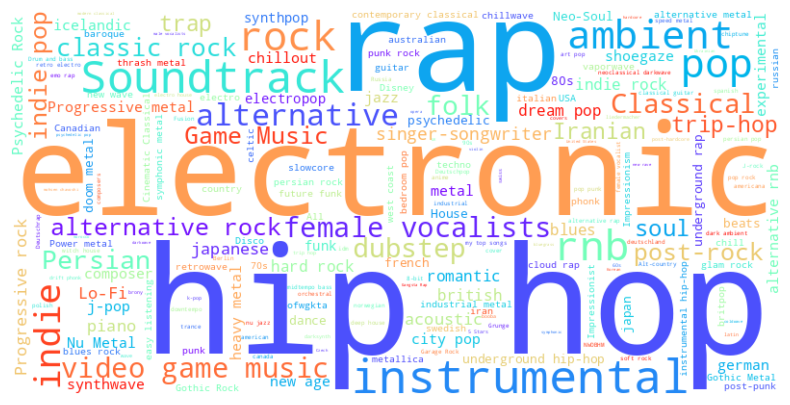

In [271]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

genre_counts = df.explode('genres')['genres'].value_counts()

wc = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='rainbow'   # <-- apply rainbow colors
).generate_from_frequencies(genre_counts)

plt.figure(figsize=(10,5))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

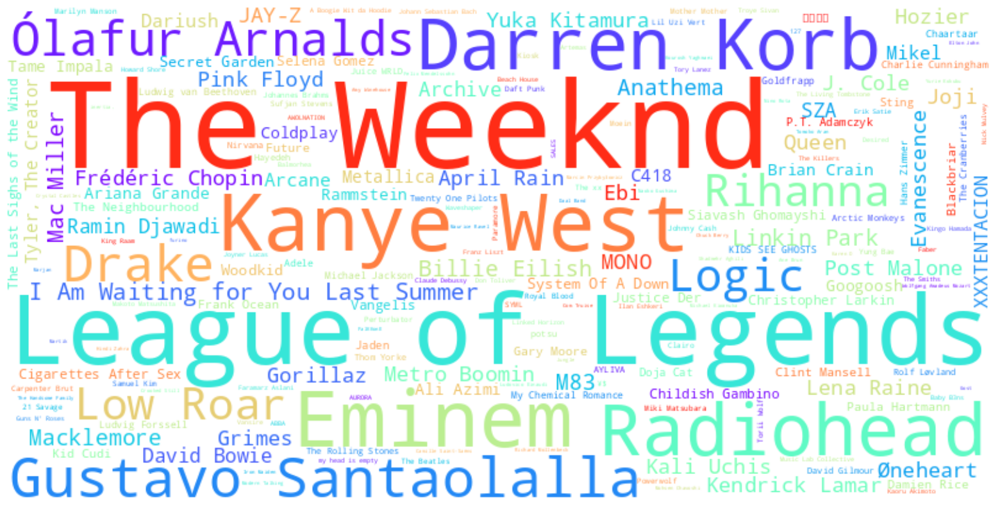

In [270]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

artist_counts = df['artist'].value_counts()

wc = WordCloud(
    width=800, 
    height=400, 
    background_color='white',
    colormap='rainbow'   # <-- apply rainbow colors
).generate_from_frequencies(artist_counts)

plt.figure(figsize=(20,10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

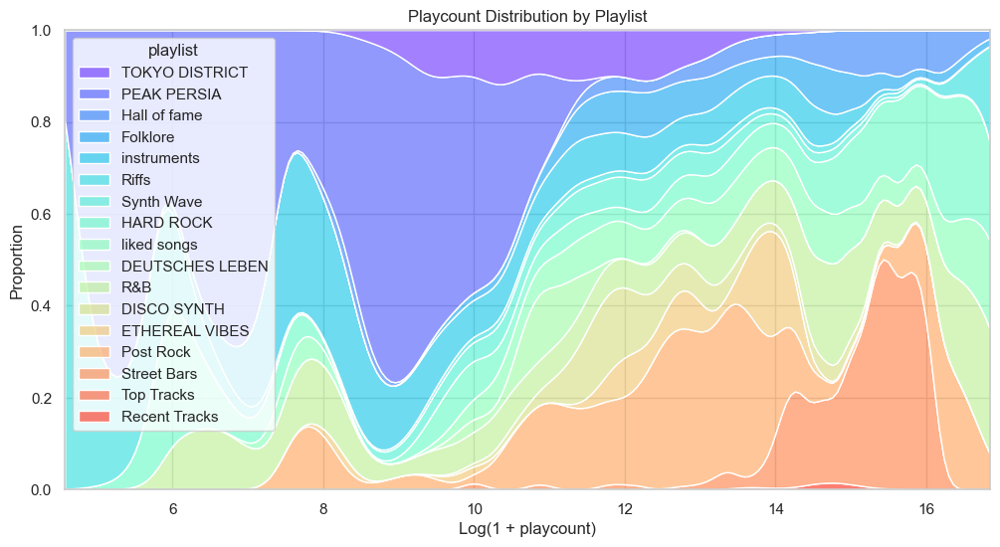

In [269]:
df_exploded = df.explode('genres')
plt.figure(figsize=(12,6))
sns.kdeplot(
    data=df_exploded,

    x= np.log1p(df_exploded["playcount"]),
    hue='playlist',
    multiple='fill',
    fill=True,
    alpha=0.6,
    linewidth=1,
    edgecolor='white',
    warn_singular=False,
    palette='rainbow'
)
plt.title("Playcount Distribution by Playlist")
plt.xlabel("Log(1 + playcount)")

plt.ylabel("Proportion")
plt.show()

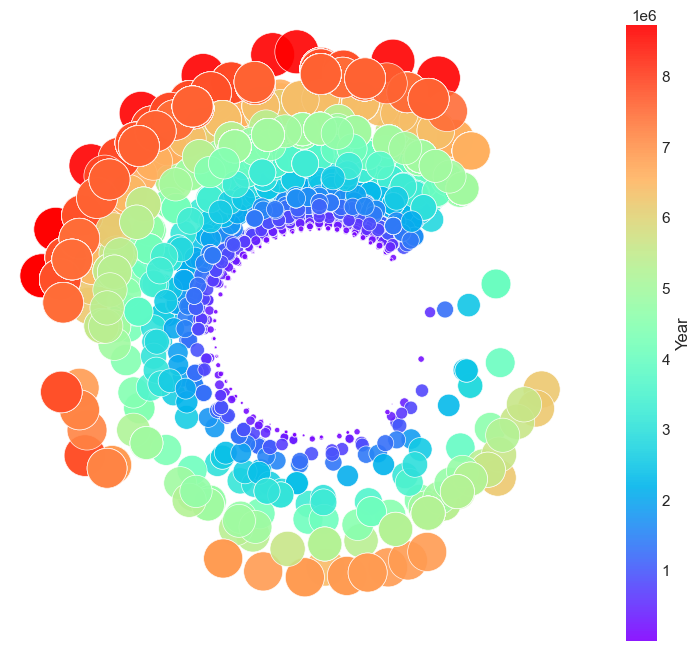

In [264]:
import matplotlib.pyplot as plt
import numpy as np

min_year, max_year = df['year'].min(), df['year'].max()
angles = 2 * np.pi * (df['year'] - min_year) / (max_year - min_year)

radii = df['playcount']

sizes = df['playcount'] / df['playcount'].max() * 1000

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(projection='polar')
# ax = fig.add_subplot()
radii = df['playcount']
scatter = ax.scatter(
    angles, 
    radii, 
    c=df['playcount'],
    s=sizes, 
    cmap='rainbow', 
    alpha=0.9,
    edgecolor='white',
    linewidth=0.5
)
y_min = -1_000_000
y_max = 10_000_000
ax.set_ylim(y_min, y_max)
# ax.set_ylim(ax.get_ylim()[::-1])
# # ax.set_rorigin(15000000)
ax.set_rorigin(-5000000)

ax.set_theta_zero_location('NE')
ax.set_theta_direction(-1)
ax.set_rlabel_position(45)
# ax.set_title("Playcount of Songs by Year (Size ~ Playcount, Color ~ Year)", fontsize=14)
ax.set_axis_off()
ax.grid(False)

cbar = fig.colorbar(scatter, ax=ax, pad=0.0)
cbar.set_label("Year")
cbar.outline.set_visible(False)
cbar.ax.tick_params(length=0)
plt.show()

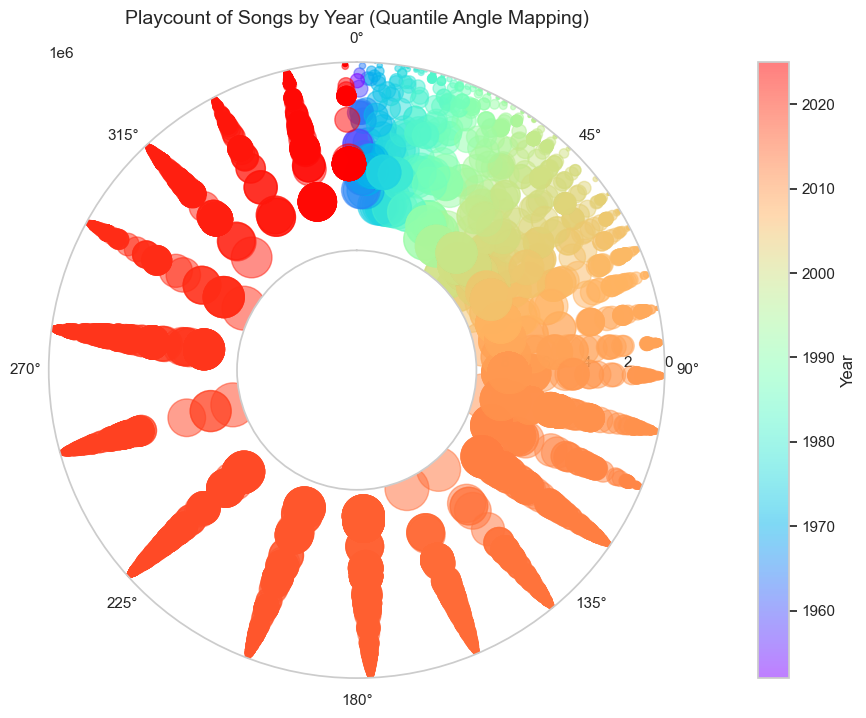

In [128]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Explode if needed
# df_exploded = df.explode('genres')

# Compute normalized rank (percentile) of each year
year_percentile = df['year'].rank(method='average') / len(df)

# Map percentile to angle (0 to 2π)
angles = 2 * np.pi * year_percentile

# Radius = playcount
radii = df['playcount']

# Dot size proportional to playcount
sizes = df['playcount'] / df['playcount'].max() * 1000

# Create figure
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='polar')

scatter = ax.scatter(
    angles,
    radii,
    c=df['year'],      # optional: color by year
    s=sizes,
    cmap='rainbow',
    alpha=0.5
)

# Invert radius so larger playcounts are near center
ax.set_ylim(ax.get_ylim()[::-1])

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rlabel_position(90)
ax.set_title("Playcount of Songs by Year (Quantile Angle Mapping)", fontsize=14)

ax.grid(False)
ax.set_rorigin(15000000.5)

# Colorbar
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Year")

plt.show()

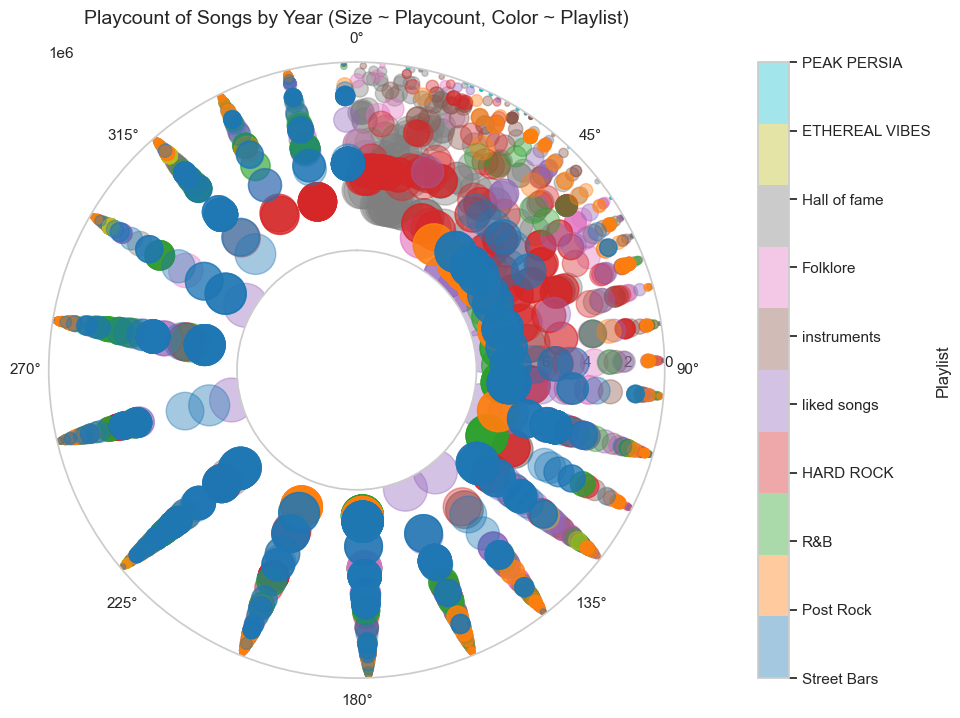

In [130]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Limit to top 10 playlists
top_playlists = df['playlist'].value_counts().head(10).index
df_plot = df[df['playlist'].isin(top_playlists)].copy()

# Compute normalized rank (percentile) of each year for angle
year_percentile = df_plot['year'].rank(method='average') / len(df_plot)
angles = 2 * np.pi * year_percentile

# Radius = playcount
radii = df_plot['playcount']

# Dot size proportional to playcount
sizes = df_plot['playcount'] / df_plot['playcount'].max() * 1000

# Map playlist to integer for color
playlist_to_int = {pl: i for i, pl in enumerate(top_playlists)}
colors = df_plot['playlist'].map(playlist_to_int)

# Create figure
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='polar')

scatter = ax.scatter(
    angles,
    radii,
    c=colors,       # color by playlist
    s=sizes,
    cmap='tab10',   # categorical colormap
    alpha=0.4
)

# Invert radius so larger playcounts are near center
ax.set_ylim(ax.get_ylim()[::-1])

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rlabel_position(90)
ax.set_title("Playcount of Songs by Year (Size ~ Playcount, Color ~ Playlist)", fontsize=14)

ax.grid(False)
ax.set_rorigin(15000000.5)

# Colorbar with playlist labels
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(len(top_playlists)))
cbar.ax.set_yticklabels(top_playlists)
cbar.set_label("Playlist")

plt.show()

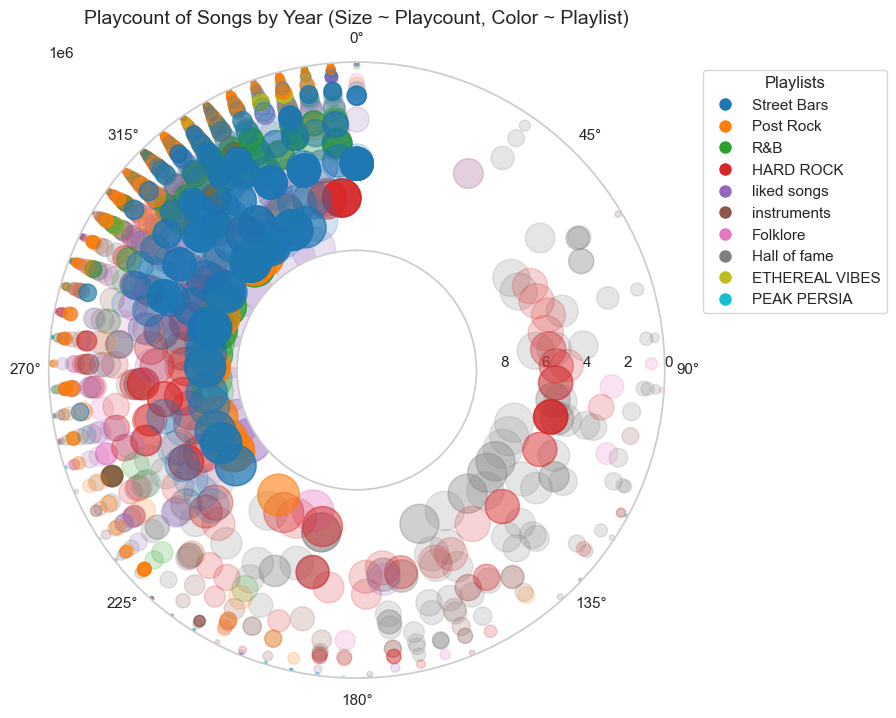

In [118]:
import matplotlib.pyplot as plt
import numpy as np

# Limit to top 10 playlists
top_playlists = df['playlist'].value_counts().head(10).index
df_filtered = df[df['playlist'].isin(top_playlists)]

# Map years to angles (0 to 2π)
min_year, max_year = df_filtered['year'].min(), df_filtered['year'].max()
angles = 2 * np.pi * (df_filtered['year'] - min_year) / (max_year - min_year)

# Radius = playcount
radii = df_filtered['playcount']

# Dot size proportional to playcount
sizes = df_filtered['playcount'] / df_filtered['playcount'].max() * 1000

# Map playlists to colors
playlist_to_int = {pl: i for i, pl in enumerate(top_playlists)}
colors = df_filtered['playlist'].map(playlist_to_int)

# Create figure
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='polar')

scatter = ax.scatter(
    angles, 
    radii, 
    c=colors,        # color by playlist
    s=sizes, 
    cmap='tab10',     # categorical colormap for up to 10 playlists
    alpha=0.2
)

# Invert the radius so larger playcounts are near the center
ax.set_ylim(ax.get_ylim()[::-1])

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rlabel_position(90)
ax.set_title("Playcount of Songs by Year (Size ~ Playcount, Color ~ Playlist)", fontsize=14)
ax.set_rorigin(15000000.5)

ax.grid(False)

# Add legend for playlists
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label=pl,
                          markerfacecolor=plt.get_cmap('tab10')(i/10), markersize=10)
                   for i, pl in enumerate(top_playlists)]
ax.legend(handles=legend_elements, title="Playlists", bbox_to_anchor=(1.05, 1))

plt.show()

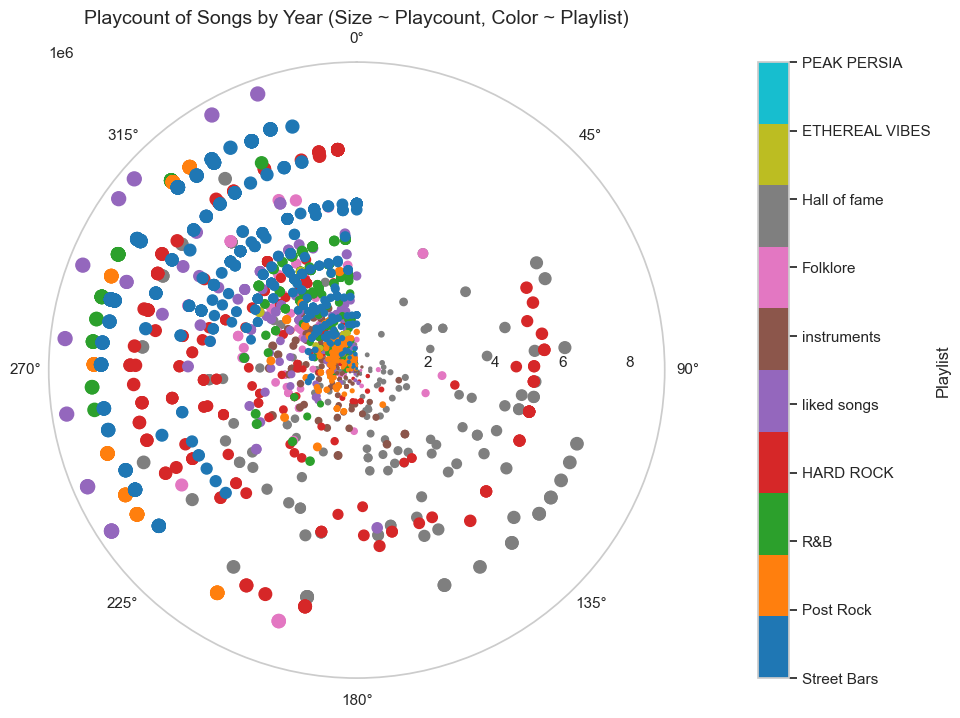

In [70]:
import matplotlib.pyplot as plt
import numpy as np

# Explode your df if needed (not strictly necessary for this plot)
# df_exploded = df.explode('genres')

# Select top 10 playlists by number of songs
top_playlists = df['playlist'].value_counts().head(10).index
df_top = df[df['playlist'].isin(top_playlists)]

# Map years to angles (0 to 2π)
min_year, max_year = df_top['year'].min(), df_top['year'].max()
angles = 2 * np.pi * (df_top['year'] - min_year) / (max_year - min_year)

# Radius = playcount
radii = df_top['playcount']

# Dot size proportional to playcount
sizes = df_top['playcount'] / df_top['playcount'].max() * 100

# Map playlists to colors
colors_map = {pl: i for i, pl in enumerate(top_playlists)}
colors = df_top['playlist'].map(colors_map)

# Create figure
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='polar')

scatter = ax.scatter(
    angles, 
    radii, 
    c=colors,       # numeric mapping of playlists
    s=sizes, 
    cmap='tab10',   # categorical colormap with 10 colors
    alpha=1
)

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rlabel_position(90)
ax.set_title("Playcount of Songs by Year (Size ~ Playcount, Color ~ Playlist)", fontsize=14)

ax.set_rorigin(0)
ax.grid(False)

# Add colorbar with playlist labels
cbar = fig.colorbar(scatter, ax=ax, pad=0.1, ticks=range(len(top_playlists)))
cbar.ax.set_yticklabels(top_playlists)
cbar.set_label("Playlist")

plt.show()

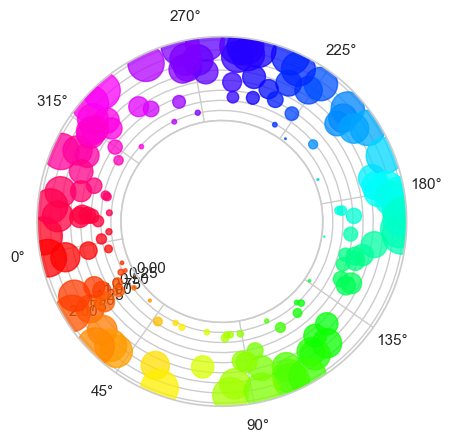

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)

# Compute areas and colors
N = 150
r = 2 * np.random.rand(N)
theta = 2 * np.pi * np.random.rand(N)
area = 200 * r**2
colors = theta

# fig = plt.figure()
# ax = fig.add_subplot(projection='polar')
# c = ax.scatter(theta, r, c=colors, s=area, cmap='hsv', alpha=0.75)
fig = plt.figure()
ax = fig.add_subplot(projection='polar')
c = ax.scatter(theta, r, c=colors, s=area, cmap='hsv', alpha=0.75)

ax.set_rorigin(-2.5)
ax.set_theta_zero_location('W', offset=10)

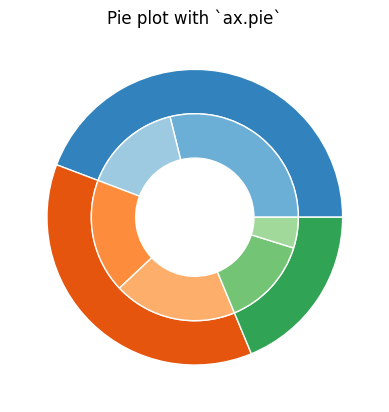

In [95]:
fig, ax = plt.subplots()

size = 0.3
vals = np.array([[60., 32.], [37., 40.], [29., 10.]])

tab20c = plt.color_sequences["tab20c"]
outer_colors = [tab20c[i] for i in [0, 4, 8]]
inner_colors = [tab20c[i] for i in [1, 2, 5, 6, 9, 10]]

ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'))

ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'))

ax.set(aspect="equal", title='Pie plot with `ax.pie`')
plt.show()

/var/folders/38/_v7mm0f14dl4r19_3bx6pqxm0000gn/T/ipykernel_414/3332228511.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_genres.values, y=top_genres.index, palette="viridis")


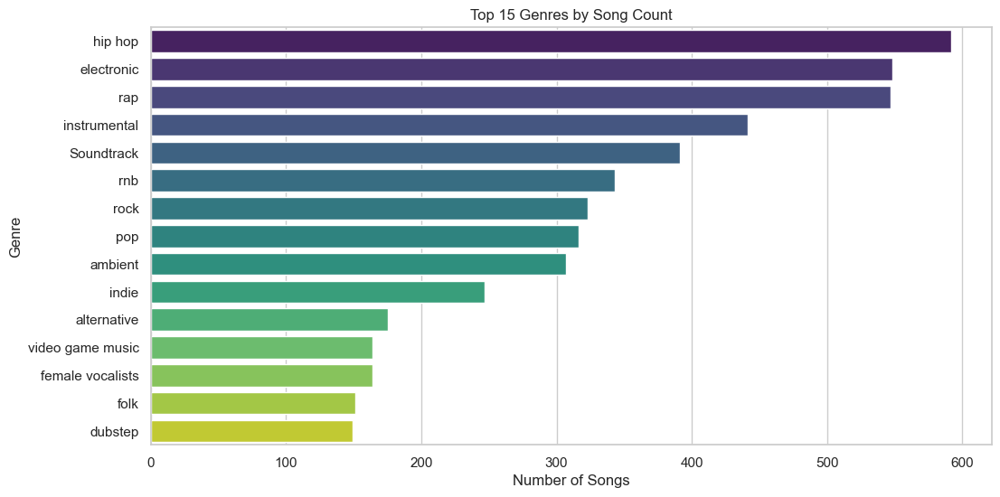

In [12]:
# Block 4: Top genres
df_exploded = df.explode('genres')
top_genres = df_exploded['genres'].value_counts().head(15)

plt.figure(figsize=(12,6))
sns.barplot(x=top_genres.values, y=top_genres.index, palette="viridis")
plt.title("Top 15 Genres by Song Count")
plt.xlabel("Number of Songs")
plt.ylabel("Genre")
plt.show()

/var/folders/38/_v7mm0f14dl4r19_3bx6pqxm0000gn/T/ipykernel_84412/2993104612.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=artist_playcount.values, y=artist_playcount.index, palette="magma")


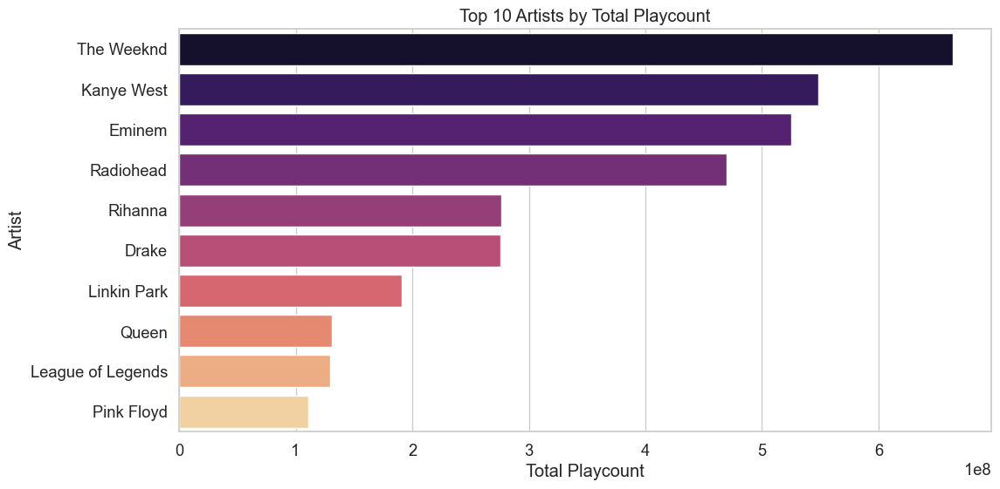

In [124]:
# Block 7: Top 10 Artists by total playcount
artist_playcount = df.groupby('artist')['playcount'].sum().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
sns.barplot(x=artist_playcount.values, y=artist_playcount.index, palette="magma")
plt.title("Top 10 Artists by Total Playcount")
plt.xlabel("Total Playcount")
plt.ylabel("Artist")
plt.show()

In [ ]:
generate_all_user_plots("31i3y3aur3k2mejzzfyuxvulxuoy")

NameError: name '__file__' is not defined